## Условие задачи:

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.

### Описание этапа обработки

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

### Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.


### План работы:
    
- Загрузить данные, провести EDA
- Подготоим данные и сделаем предобработку:
    - Удалим лишние данные 
    - Определим признаки необходимые для модели
    - Соберем все нужные данные в одну таблицу с признаками key
- Будем использовать XGBoost, CatBoost, LightGBM, LinearRegression с подбором нужных параметров
- Сравним полученные результаты наших моделей и выделим лучшую
- Проверим на тестовой выборке
- Напишем отчет

## Исследовательский Анализ Данных

### Импорт библиотек

In [1]:
#Импорт библиотек
import os
import math
import time
import itertools 
import urllib.request
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style("whitegrid")
import xgboost as xgb
import lightgbm as lgb
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
%matplotlib inline
from pathlib import Path
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')
from scipy import stats

### Загрузка данных

In [2]:
data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv')
data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')
data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv')
data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')
data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv')
data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')
data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv')

In [3]:
def dataset_info(data):
    print('Топ 10 cтрок')
    display(data.head(10))
    print('Информация')
    print(data.info())
    print('\nОписание')
    display(data.describe())
    print('Количество дубликатов:', data.duplicated().sum())
    print('Количество уникальных значений по номеру партии:', data['key'].nunique())

In [4]:
dataset_info(data_arc)

Топ 10 cтрок


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


Информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
key                     14876 non-null int64
Начало нагрева дугой    14876 non-null object
Конец нагрева дугой     14876 non-null object
Активная мощность       14876 non-null float64
Реактивная мощность     14876 non-null float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB
None

Описание


,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


Количество дубликатов: 0
Количество уникальных значений по номеру партии: 3214


- 14 876 строк, с 5 столбцами.
- Необходимо будет изменить тип данных у  "Начало нагрева дугой" и "Конец нагрева дугой" на `datetime`
- Пропусков не имеется, Дубликатов также нет
- Аномальное значение `-715` Реактивной мощности - возможно ошибка измерения
- Количество уникальных значений по номеру партии: 3214

Изменим тип данных на datetime

In [5]:
data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'])
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
key                     14876 non-null int64
Начало нагрева дугой    14876 non-null datetime64[ns]
Конец нагрева дугой     14876 non-null datetime64[ns]
Активная мощность       14876 non-null float64
Реактивная мощность     14876 non-null float64
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


### Активная и реактивная мощности

#### Теория



__Активная мощность (P)__ - фактическая, настоящая, полезная, реальная мощность.


__Реактивная мощность (Q)__ -  Также её мощно было бы назвать бесполезной или безваттной мощностью. Мощность, которая постоянно перетекает туда и обратно между источником и нагрузкой, известна как реактивная

__Полная мощность (S)__ – это произведение напряжения и тока при игнорировании фазового угла между ними. Вся мощность в сети переменного тока (рассеиваемая и поглощаемая/возвращаемая) является полной.

__$$ S = \sqrt{{P}^2 + {Q}^2} $$__

Источник: http://electrokaprizam.net/content/35-chto-takoe-kva-kwt-kvar

In [6]:
def draw_plot(data, parametr, bins=30):
        fig = plt.figure(figsize=(15, 10), dpi= 80)
        grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.2)
        ax_main = fig.add_subplot(grid[:-1, :-1])
        ax_right = fig.add_subplot(grid[:-1, -1])  
        sns.distplot(data[parametr], ax=ax_main)
        sns.boxplot(data[parametr], ax=ax_right)
        ax_right.grid(axis='y')
        ax_main.set(title='График '+parametr)
        ax_main.axvline(np.mean(data[parametr]),color='g', linestyle='--', label='Среднее')
        ax_main.axvline(np.median(data[parametr]),color='g', linestyle='-', label='Медиана')
        ax_main.legend()
        fig.show()

#### Распределение активной мощности 

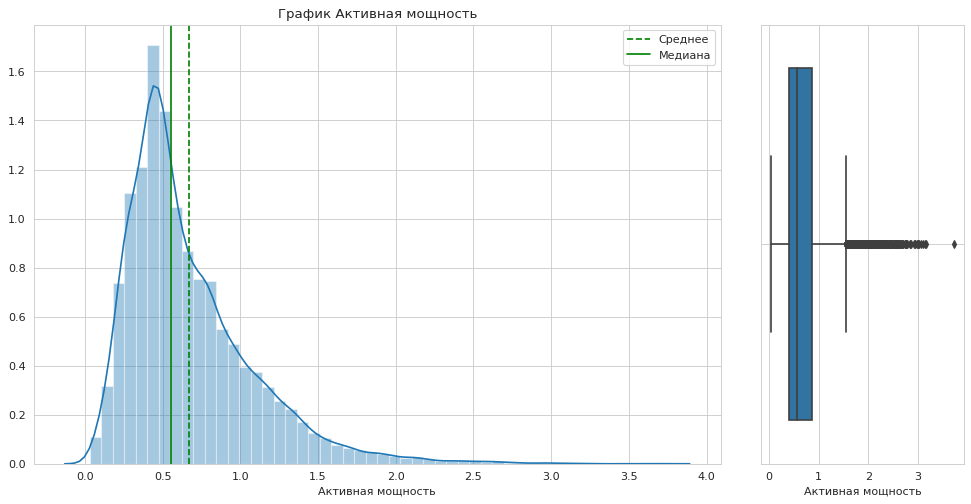

In [7]:
draw_plot(data_arc,'Активная мощность')

#### Распределение реактивной мощности

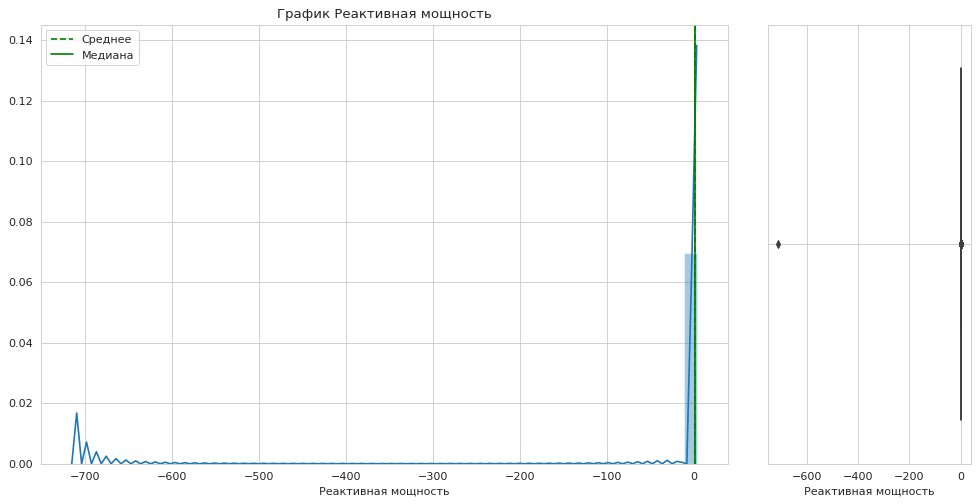

In [8]:
draw_plot(data_arc, 'Реактивная мощность')

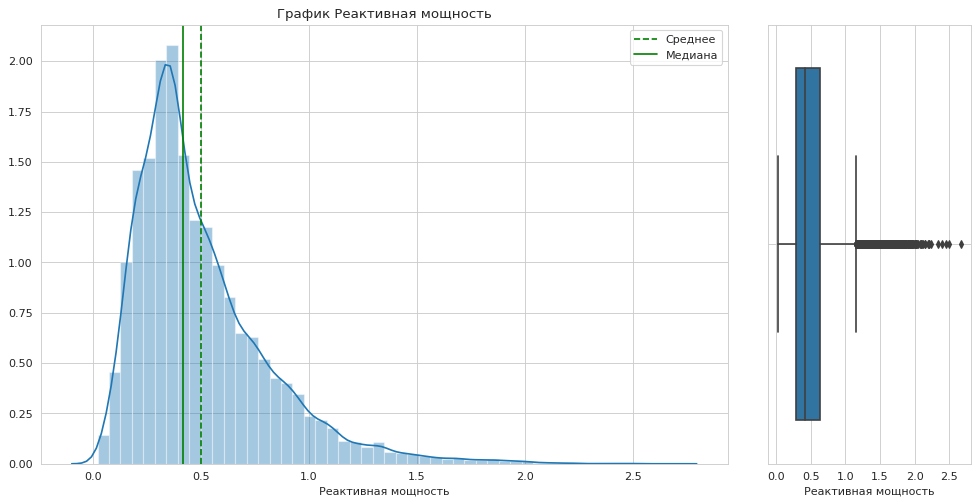

In [9]:
data_arc = data_arc[data_arc['Реактивная мощность'] >= 0]
draw_plot(data_arc, 'Реактивная мощность')

In [10]:
print('Корреляция активной и реактивной мощности', data_arc['Активная мощность'].corr(data_arc['Реактивная мощность']))

Корреляция активной и реактивной мощности 0.9631819131519803


Реактивная и активная мощности имеют сильную корреляцию. Можно их объединить по формуле:

__$$ S = \sqrt{{P}^2 + {Q}^2} $$__

- S - полная мощность
- P - активная мощность
- Q - реактивная мощность

Формула расчета полной мощности

In [11]:
def full_power(row):
    full_power = math.sqrt(row['Активная мощность']**2 + row['Реактивная мощность']**2)
    return full_power

data_arc['Полная мощность'] = data_arc.apply(full_power, axis=1)

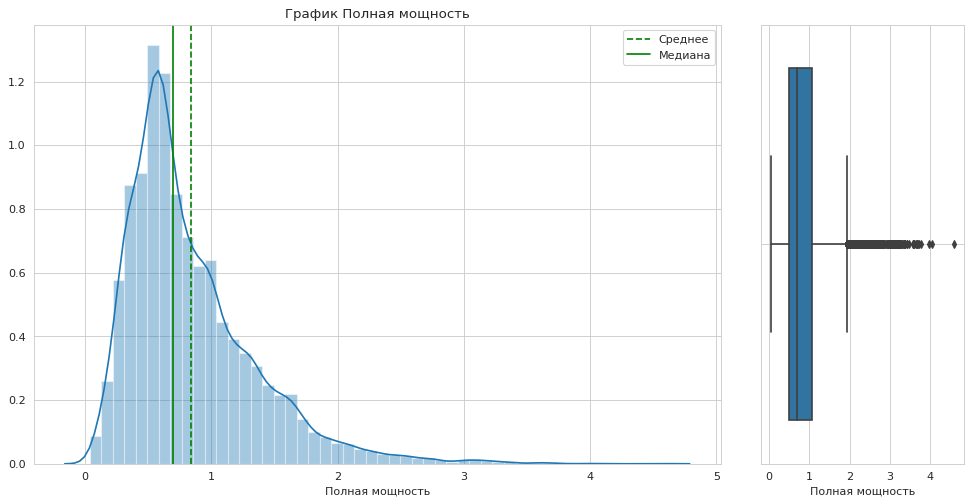

In [12]:
draw_plot(data_arc, 'Полная мощность')

In [13]:
data_arc.head(5)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Полная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,1.193639
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0.959010
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0.896038
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,1.970470
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0.807239


#### Вывод:

- Дубликатов и пустых значений не имеется
- Изменили типы данных на datetime в столбце `начало нагрева дугой` и `конец нагрева дугой`
- Избавились от аномальных значений `-715` в Реактивной мощности. 
- Разобрались, что такое активная и реактивная мощности. 
- Добавили новый признак `полная мощность` - из-за сильной корреляции между активной и реактивной мощностями

### Данные о подаче сыпучих материалов (объём)

In [14]:
dataset_info(data_bulk)

Топ 10 cтрок


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


Информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
key        3129 non-null int64
Bulk 1     252 non-null float64
Bulk 2     22 non-null float64
Bulk 3     1298 non-null float64
Bulk 4     1014 non-null float64
Bulk 5     77 non-null float64
Bulk 6     576 non-null float64
Bulk 7     25 non-null float64
Bulk 8     1 non-null float64
Bulk 9     19 non-null float64
Bulk 10    176 non-null float64
Bulk 11    177 non-null float64
Bulk 12    2450 non-null float64
Bulk 13    18 non-null float64
Bulk 14    2806 non-null float64
Bulk 15    2248 non-null float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB
None

Описание


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Количество дубликатов: 0
Количество уникальных значений по номеру партии: 3129


#### Вывод
- Дубликатов нет 
- Типы данных указаны верно 
- Большое количество пропущенных значений 

### Данные о подаче сыпучих материалов (время)

In [15]:
dataset_info(data_bulk_time)

Топ 10 cтрок


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56
5,6,NaN,NaN,NaN,2019-05-03 13:59:24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:53:27,NaN,2019-05-03 13:53:27,2019-05-03 13:53:27
6,7,NaN,NaN,NaN,2019-05-03 14:29:14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:22:19,NaN,2019-05-03 14:22:19,2019-05-03 14:22:19
7,8,NaN,NaN,NaN,2019-05-03 15:04:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:55:46,NaN,2019-05-03 14:55:46,2019-05-03 14:55:46
8,9,NaN,NaN,NaN,2019-05-03 15:47:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 15:41:00,NaN,2019-05-03 15:41:00,2019-05-03 15:41:00
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 16:18:52,NaN,2019-05-03 16:18:52,2019-05-03 16:18:52


Информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
key        3129 non-null int64
Bulk 1     252 non-null object
Bulk 2     22 non-null object
Bulk 3     1298 non-null object
Bulk 4     1014 non-null object
Bulk 5     77 non-null object
Bulk 6     576 non-null object
Bulk 7     25 non-null object
Bulk 8     1 non-null object
Bulk 9     19 non-null object
Bulk 10    176 non-null object
Bulk 11    177 non-null object
Bulk 12    2450 non-null object
Bulk 13    18 non-null object
Bulk 14    2806 non-null object
Bulk 15    2248 non-null object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB
None

Описание


,key
count,3129.000000
mean,1624.383509
std,933.337642
min,1.000000
25%,816.000000
50%,1622.000000
75%,2431.000000
max,3241.000000


Количество дубликатов: 0
Количество уникальных значений по номеру партии: 3129


#### Вывод:
- Большое количество пустых значений
- Дубликатов нет
- В модели данный датасет не будет использоваться - предобработку делать нет необходимости

### Данные о продувке сплава газом

In [16]:
dataset_info(data_gas)

Топ 10 cтрок


,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
5,6,11.273392
6,7,9.836267
7,8,15.171553
8,9,8.216623
9,10,6.529891


Информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
key      3239 non-null int64
Газ 1    3239 non-null float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB
None

Описание


,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


Количество дубликатов: 0
Количество уникальных значений по номеру партии: 3239


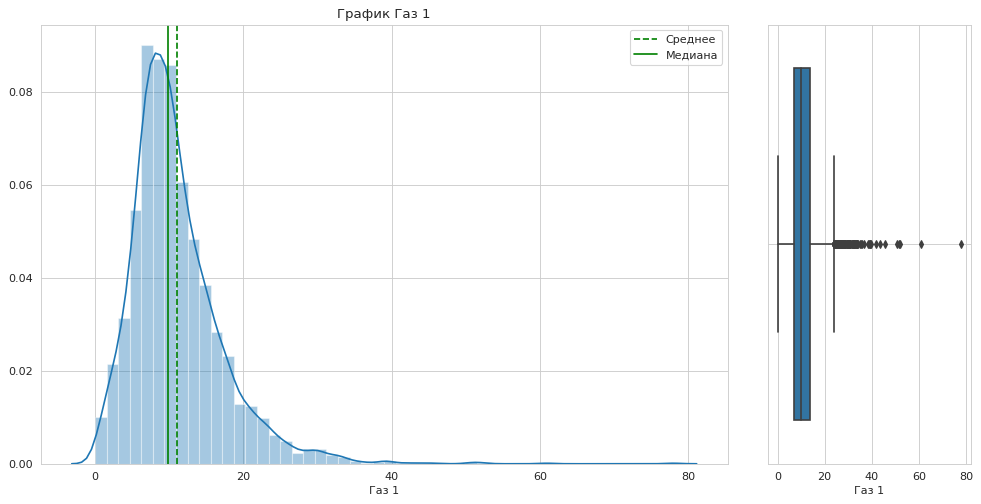

In [17]:
draw_plot(data_gas, 'Газ 1')

#### Вывод:
- Распределение данных нормальное
- Дубликатов нет
- Пустых значений нет

### Данные о проволочных материалах (объём)

In [18]:
dataset_info(data_wire)

Топ 10 cтрок


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
key       3081 non-null int64
Wire 1    3055 non-null float64
Wire 2    1079 non-null float64
Wire 3    63 non-null float64
Wire 4    14 non-null float64
Wire 5    1 non-null float64
Wire 6    73 non-null float64
Wire 7    11 non-null float64
Wire 8    19 non-null float64
Wire 9    29 non-null float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB
None

Описание


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442841,15.132,48.016974,10.039007,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,2434.000000,126.060484,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


Количество дубликатов: 0
Количество уникальных значений по номеру партии: 3081


#### Вывод
- Дубликатов нет
- Типы данных указаны правильно
- Имеются пустые значения в датасете, скорее всего они пустые потому что различные виды проволочных материалов поступали в разных пропорциях в разные промежутки времени.

### Данные о проволочных материалах (время)

In [19]:
dataset_info(data_wire_time)

Топ 10 cтрок


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,2019-05-03 13:59:02,2019-05-03 13:59:54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,2019-05-03 14:28:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,2019-05-03 15:03:42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,2019-05-03 15:42:43,2019-05-03 15:58:12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,2019-05-03 16:20:25,2019-05-03 16:21:02,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
key       3081 non-null int64
Wire 1    3055 non-null object
Wire 2    1079 non-null object
Wire 3    63 non-null object
Wire 4    14 non-null object
Wire 5    1 non-null object
Wire 6    73 non-null object
Wire 7    11 non-null object
Wire 8    19 non-null object
Wire 9    29 non-null object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB
None

Описание


,key
count,3081.000000
mean,1623.426485
std,932.996726
min,1.000000
25%,823.000000
50%,1619.000000
75%,2434.000000
max,3241.000000


Количество дубликатов: 0
Количество уникальных значений по номеру партии: 3081


#### Вывод 
- Дубликатов нет
- Есть пустые значения
- Есть пробелмы с типом данных, но не будем менять так как далее этот датасет использовать не будем.

### Результаты измерения температуры

In [20]:
dataset_info(data_temp)

Топ 10 cтрок


,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
5,2,2019-05-03 11:37:27,1581.0
6,2,2019-05-03 11:38:00,1577.0
7,2,2019-05-03 11:49:38,1589.0
8,2,2019-05-03 11:55:50,1604.0
9,2,2019-05-03 11:58:24,1608.0


Информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
key             15907 non-null int64
Время замера    15907 non-null object
Температура     13006 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB
None

Описание


,key,Температура
count,15907.000000,13006.000000
mean,1607.880870,1591.840920
std,942.212073,21.375851
min,1.000000,1191.000000
25%,790.000000,1581.000000
50%,1618.000000,1591.000000
75%,2427.000000,1601.000000
max,3241.000000,1705.000000


Количество дубликатов: 0
Количество уникальных значений по номеру партии: 3216


Изменим тип данных на времени замера

In [21]:
data_temp['Время замера'] = pd.to_datetime(data_temp['Время замера'])

In [22]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
key             15907 non-null int64
Время замера    15907 non-null datetime64[ns]
Температура     13006 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 372.9 KB


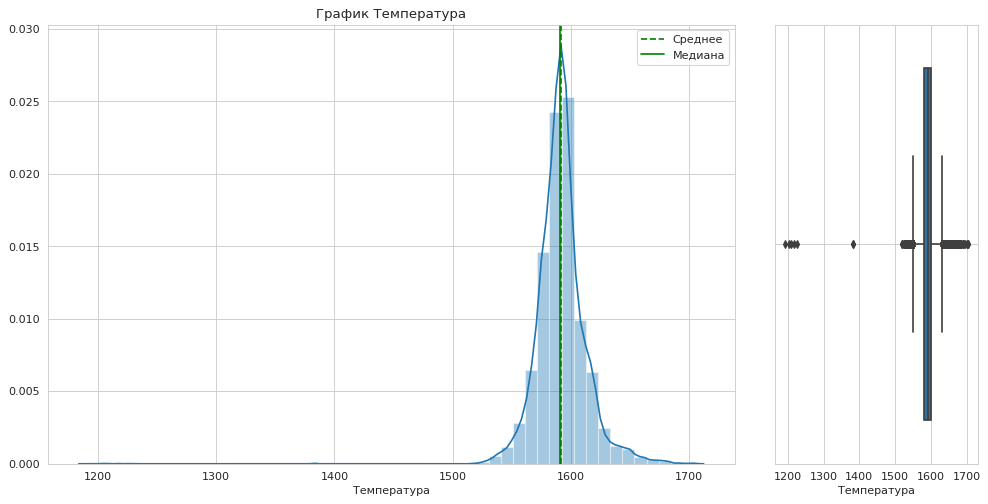

In [23]:
draw_plot(data_temp[data_temp['Температура'].notnull()], 'Температура')

#### Вывод
- Изменили тип данных 
- Распределение данных нормальное
- Нет температуры для некоторых данных - удалим их 
- Дубликатов нет

### Вывод по EDA
- Загрузили данные, изучили.
- Проверили данные на пропуски и на дубликаты.
- Избавились от некоторых аномальных значений.
- Изменили типы данных, в некоторых датасетах были неправильно указаны данные типа Datetime
- Проверили данные на пропуски и дубликаты.
- В датасете data_arc ввели сразу новый признак "Полная мощность"

## Предобработка данных

#### План работы:
- Объединим таблицы в один датасет для модели
- Обработаем пропуски 
- Целевой признак - Последняя температура 
- Проведем срез данных по Key до начиная с 2500 партии

#### data_arc (данные об электродах)

Новый признак "Общее время нагрева дугой", переведем в секунды

In [24]:
data_arc['Общее время нагрева дугой'] = data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']
data_arc['Общее время нагрева дугой'] = data_arc['Общее время нагрева дугой'].dt.seconds

Поcле 2500 партии значения температуры есть только для первого измерения, поэтому будем использовать только партии до 2500 номера.

In [25]:
data_temp = data_temp.query('key < 2500')
data_arc = data_arc.query('key < 2500')
data_bulk = data_bulk.query('key < 2500')
data_wire = data_wire.query('key < 2500')

Определим количество итераций нагрева

In [26]:
data_arc_c = data_arc.groupby(by = 'key', as_index = False).count()[['key', 'Начало нагрева дугой']]
data_arc_c.columns = ['key', 'Количество итераций нагрева']

Сгруппируем данные по партиям и добавим информацию о количестве итераций нагрева по ключу key

In [27]:
data_arc = data_arc.groupby(by = 'key', as_index = False).sum()
data_arc = data_arc.merge(data_arc_c, how = 'left', on = 'key')

Будем использовать признак только полная мощность, так как признаки активная и реактивная мощности сильно коррелируют между собой 

In [28]:
data_arc = data_arc[['key', 'Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']]

Посмотрим на корреляцию имеющихся признаков

<Figure size 1080x720 with 0 Axes>

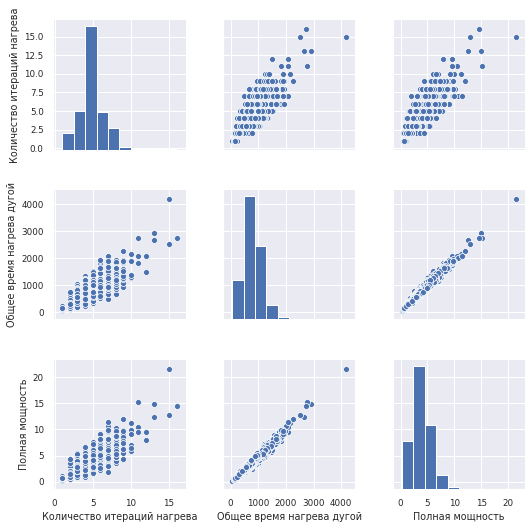

In [29]:
plt.figure(figsize=(15,10))
sns.set(font_scale=0.8)
sns.pairplot(data_arc[['Количество итераций нагрева', 'Общее время нагрева дугой', 'Полная мощность']], 
             kind="scatter")
plt.show();

In [30]:
data_arc[['Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']].corr()

,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
Полная мощность,1.000000,0.982899,0.760402
Общее время нагрева дугой,0.982899,1.000000,0.795958
Количество итераций нагрева,0.760402,0.795958,1.000000


Сильная корреляция между полной мощностью и общим временем нагрева дугой. Попробуем избавиться от времени нагрева дугой для нашей будущей модели. Уберем из датасета столбец "Общее время нагрева дугой"

In [31]:
data_arc = data_arc[['key', 'Полная мощность', 'Количество итераций нагрева']]

#### data-temp (результаты измерения температуры)

Очистим пропуски в данных в таблице data_temp

In [32]:
data_temp = data_temp.dropna(subset=['Температура']).reset_index(drop=True)
data_temp = data_temp.sort_values(by=['Время замера'])

Удалим информацию о партиях по которым известно только одно измерение температуры.

In [33]:
count = data_temp.groupby(by = 'key', as_index = False).count()
one = count[count['Время замера'] == 1]['key'].tolist()
data_temp = data_temp.query('key not in @one')

Сгруппируем данные по партии по первым и последним значениям, последние значения необходимо будет предсказывать.

In [34]:
data_temp = data_temp.groupby(by = 'key').agg(['first', 'last']).reset_index()
data_temp.columns = data_temp.columns.droplevel()
data_temp.columns = ['key', 'Время замера 1', 'Время замера 2', 'Температура 1', 'Температура 2']
data_temp = data_temp[['key', 'Температура 1', 'Температура 2']]

#### Объединим данные в одну таблицу

In [35]:
data = (data_temp.merge(data_arc, how = 'left', on = 'key')
                 .merge(data_wire, how = 'left', on = 'key')
                 .merge(data_bulk, how = 'left', on = 'key')
                 .merge(data_gas, how = 'left', on = 'key')
       )

Заполним пропуски образовавшиеся после объединения таблиц нулями

In [36]:
data = data.fillna(0)

Переименуем столбцы для корректной работы lgbm

In [37]:
data = data.rename(columns={'Температура 1': 'First_temp',
                            'Температура 2': 'Last_temp',
                            'Полная мощность': 'Full_power',
                            'Количество итераций нагрева':'Heating_iterations',
                            'Газ 1': 'Gas'})

Уберем колонку-индентификатор key, которую мы использовали для объединения датасетов

In [38]:
data = data.drop(['key'], axis = 1)

In [39]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2475 entries, 0 to 2474
Data columns (total 29 columns):
First_temp            2475 non-null float64
Last_temp             2475 non-null float64
Full_power            2475 non-null float64
Heating_iterations    2475 non-null int64
Wire 1                2475 non-null float64
Wire 2                2475 non-null float64
Wire 3                2475 non-null float64
Wire 4                2475 non-null float64
Wire 5                2475 non-null float64
Wire 6                2475 non-null float64
Wire 7                2475 non-null float64
Wire 8                2475 non-null float64
Wire 9                2475 non-null float64
Bulk 1                2475 non-null float64
Bulk 2                2475 non-null float64
Bulk 3                2475 non-null float64
Bulk 4                2475 non-null float64
Bulk 5                2475 non-null float64
Bulk 6                2475 non-null float64
Bulk 7                2475 non-null float64
Bulk 8         

#### Разделим на обучающую и тестовую выборку

In [40]:
train, test = train_test_split(data, test_size = .30, random_state = 123)
train.head(10)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
1713,1610.0,1592.0,2.127062,4,97.063194,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,345.0,0.0,177.0,125.0,11.903262
209,1620.0,1598.0,2.823146,4,67.136154,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,105.0,0.0,114.0,203.0,8.093390
559,1599.0,1625.0,4.174300,3,49.186798,60.169201,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,204.0,0.0,174.0,201.0,10.013142
1540,1614.0,1592.0,2.471755,4,149.104807,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,205.0,0.0,141.0,106.0,15.331946
2114,1580.0,1585.0,2.259940,3,63.991199,0.000000,0.0,0.0,0.0,50.072884,...,0.0,0.0,0.0,0.0,0.0,255.0,0.0,109.0,224.0,7.664096
348,1575.0,1594.0,5.770557,6,63.367203,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,205.0,0.0,237.0,104.0,15.399860
2465,1613.0,1579.0,1.430227,2,67.136162,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,24.0,103.0,0.0,149.0,104.0,10.772628
1341,1538.0,1600.0,7.016766,6,105.112795,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,409.0,0.0,205.0,206.0,7.450587
483,1586.0,1618.0,4.941969,4,76.049995,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,154.0,205.0,15.982273
2128,1570.0,1575.0,4.221630,5,95.047676,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,19.0,159.0,153.0,0.0,108.0,9.329237


#### Mасштабирование признаков

##### Количественные признаки

In [41]:
numeric = data.columns.tolist()
numeric = [i for i in numeric if i not in ('Last_temp')]
scaler = MinMaxScaler()
scaler.fit(train[numeric])

MinMaxScaler(copy=True, feature_range=(0, 1))

##### Обучаюющая выборка

In [42]:
train[numeric] = scaler.transform(train[numeric])

##### Тестовая выборка

In [43]:
test[numeric] = scaler.transform(test[numeric])

Размеры выборок

In [44]:
print('Количество данных в обучающей выборке: ', train.shape[0])
print('Количество данных в тестовой выборке:', test.shape[0])

Количество данных в обучающей выборке:  1732
Количество данных в тестовой выборке: 743


### Вывод

- Удалили пустые значения
- Обьединили все талблицы в одну 
- Разделили выборки на 30% тестовой выборки и 70% обучающей выборки
- Сделали масштабирование признаков

## Модель

Определим target и features для обучающей выборки

In [45]:
features_train = train.drop(['Last_temp'], axis = 1)
target_train = train['Last_temp']

Определим target и features для тестовой выборки

In [46]:
features_test = test.drop(['Last_temp'], axis = 1)
target_test = test['Last_temp']

Наилучшие параметры подобранные для наших моделей

In [47]:
def fit(train_features, train_actuals):
    for name in models.keys():
        est = models[name]
        est_params = params[name]
        gscv = GridSearchCV(estimator=est, param_grid=est_params, cv=5)
        gscv.fit(train_features, train_actuals)
        train_predictions = gscv.predict(features_train)
        predictions = gscv.predict(features_test)
        result_list.append({
            'model': name,
            'train_mae_score': mean_absolute_error(target_train, train_predictions),
            'test_mae_score': mean_absolute_error(target_test, predictions),
            'best_params': gscv.best_params_
            })

Определим модели и их параметры

In [48]:
models = {
    'CatBoostRegressor': CatBoostRegressor(),
#    'LGBMRegressor': lgb.LGBMRegressor(),
    'XGBRegressor': xgb.XGBRegressor(),
    'LinearRegression': LinearRegression()
}


params = {
    'CatBoostRegressor':{
          'loss_function':['MAE'],
          'n_estimators': np.arange(300, 700, 100),  
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[17],
          'depth': np.arange(3, 7)
    },        

    'LinearRegression':{
            'fit_intercept' : [True, False],
            'normalize':[True,False]
    },
    
    
    'LGBMRegressor': {
        'boosting_type': ['gbdt', 'dart', 'goss', 'rf'],
        'objective': ['regression'],
        'learning_rate': [0.001, 0.01, 0.02, 0.03],
        'num_iterations':[500],
        'random_state': [42], 
        'max_depth': np.arange(2, 10),
        'metric': ['mae']
        },

    
    'XGBRegressor': {
        'min_child_weight': [10,20,30],
        'gamma': [5],
        'subsample': [1.0],
        'colsample_bytree': [1.0],
        'max_depth': [5,10,20],
        'eval_metric' :['mae']
        }
}

Результаты модели

In [49]:
%%time
result_list = []
fit(features_train, target_train)

0:	learn: 10.1074431	total: 47.9ms	remaining: 14.3s
1:	learn: 10.0646618	total: 48.7ms	remaining: 7.25s
2:	learn: 10.0262661	total: 49.3ms	remaining: 4.88s
3:	learn: 9.9746374	total: 50ms	remaining: 3.7s
4:	learn: 9.9385984	total: 50.7ms	remaining: 2.99s
5:	learn: 9.8712676	total: 51.4ms	remaining: 2.52s
6:	learn: 9.7907872	total: 52.1ms	remaining: 2.18s
7:	learn: 9.7508440	total: 52.8ms	remaining: 1.93s
8:	learn: 9.7195735	total: 53.4ms	remaining: 1.73s
9:	learn: 9.6681480	total: 54.1ms	remaining: 1.57s
10:	learn: 9.6253404	total: 55ms	remaining: 1.44s
11:	learn: 9.5923878	total: 55.7ms	remaining: 1.34s
12:	learn: 9.5430409	total: 57.2ms	remaining: 1.26s
13:	learn: 9.5000575	total: 58.1ms	remaining: 1.19s
14:	learn: 9.4497807	total: 59.4ms	remaining: 1.13s
15:	learn: 9.4342831	total: 60ms	remaining: 1.06s
16:	learn: 9.3835696	total: 138ms	remaining: 2.3s
17:	learn: 9.3599358	total: 139ms	remaining: 2.18s
18:	learn: 9.3180948	total: 140ms	remaining: 2.06s
19:	learn: 9.2464316	total: 14

In [ ]:
result_list

In [52]:
results = pd.DataFrame(result_list, columns=['model','train_mae_score','test_mae_score','best_params'])
results.set_index("model", inplace = True)

In [53]:
results

,train_mae_score,test_mae_score,best_params
model,,,
CatBoostRegressor,4.413951,6.001543,"{'depth': 3, 'learning_rate': 0.11000000000000..."
XGBRegressor,4.113486,6.084545,"{'colsample_bytree': 1.0, 'eval_metric': 'mae'..."
LinearRegression,7.785389,7.949754,"{'fit_intercept': True, 'normalize': False}"


### Вывод

- Провели подбор параметров к 3м моделям CatBoost, XGboost и LinearRegression
- Наилучшие результаты получили у CatBoost с результатом mae 6.0 на тестовой выборке
- У XGBoost по 6.08 и 6.32 MAE на тестовой выборке соответственно
- Хуже всего показала результат модель LinearRegression с результатом 7.94 на тестовой выборке

### Финальная модель на тестовой выборке с наилучшими параметрами


In [50]:
model = CatBoostRegressor(depth=6, 
                          learning_rate = 0.03, 
                          loss_function = 'MAE', 
                          n_estimators = 600, 
                          random_state = 17,
                          verbose = 0)

model.fit(features_train,target_train)
predictions = model.predict(features_test)
print('MAE на тестовой выборке:', mean_absolute_error(predictions,target_test))

MAE на тестовой выборке: 5.950106780265593


#### Feature Importance

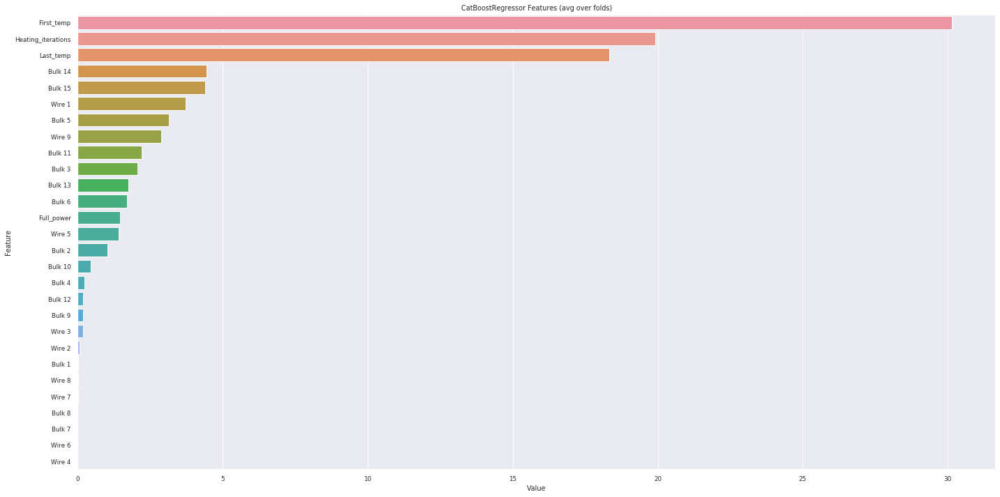

In [51]:
warnings.simplefilter(action='ignore', category=FutureWarning)
# sorted(zip(clf.feature_importances_, X.columns), reverse=True)
feature_imp = pd.DataFrame(sorted(zip(model.feature_importances_,train.columns)), columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('CatBoostRegressor Features (avg over folds)')
plt.tight_layout()
plt.show()


## Общий вывод

- Провели Исследовательский анализ данных
- Сделали предобработку данных
- Добавили новые признаки 
- Сделали масштабирование данных
- Для обучения использовали 4 модели: 
    - CatBoostRegressor
    - LightGBMRegressor
    - XGboostRegressor
    - LinearRegression
- Провели подбор гиперпараметров с помощью GridSearchCV
- Набрали наилучший результат MAE 5.8 на тестовой выборке CatBoostRegressor
- Так же выявили признаки, которые больше всего влияют на модель это Начальная температура, Полная мощность и Wire 1